In [1]:
import sys,os
import scanpy as sc

In [2]:
GW25_adata = sc.read_10x_mtx("/media/ernohanninen/TOSHIBA2/masterproject/Analysis_Herb_Ament_Human_Development_Hypothalamus_Counts/Raw_data_Herb_Ament_Human_Development_Hypothalamus_Counts/data/GW25_3V_hypo", var_names="gene_symbols")

In [3]:
GW25_adata.var_names_make_unique()

In [4]:
GW25_adata

AnnData object with n_obs × n_vars = 8437 × 33694
    var: 'gene_ids'

In [5]:
#Predict doublet
sc.external.pp.scrublet(GW25_adata, expected_doublet_rate=0.04 )

/home/ernohanninen/miniconda3/envs/PYenv/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.18
Detected doublet rate = 3.8%
Estimated detectable doublet fraction = 47.5%
Overall doublet rate:
	Expected   = 4.0%
	Estimated  = 8.0%


In [6]:
GW25_adata.obs.predicted_doublet.value_counts()

False    8116
True      321
Name: predicted_doublet, dtype: int64

In [7]:
#Remove doublets
GW25_adata.obs["sample"] = GW25_adata.obs.index
keep = GW25_adata.obs.predicted_doublet[GW25_adata.obs.predicted_doublet == False].index
GW25_adata = GW25_adata[GW25_adata.obs["sample"].isin(keep)].copy()
GW25_adata.obs = GW25_adata.obs.drop(columns="sample")

In [8]:
GW25_adata

AnnData object with n_obs × n_vars = 8116 × 33694
    obs: 'doublet_score', 'predicted_doublet'
    var: 'gene_ids'
    uns: 'scrublet'

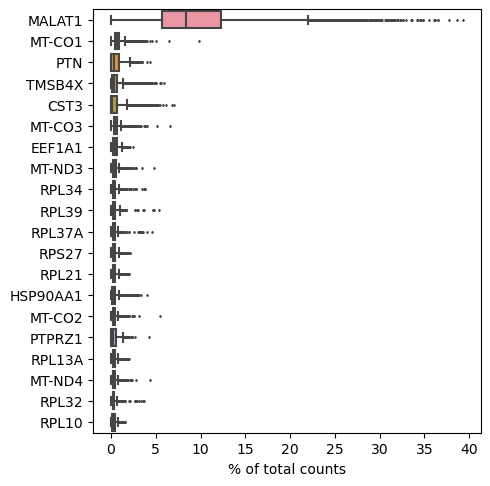

In [9]:
sc.pl.highest_expr_genes(GW25_adata, n_top=20)

# Data preprocessing

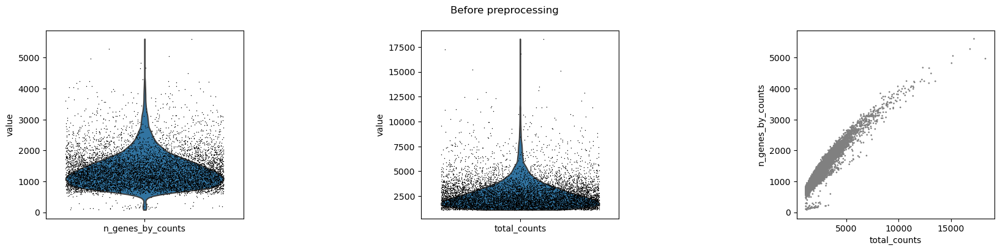

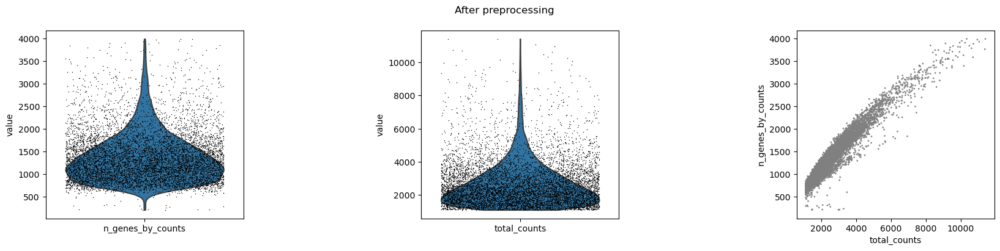

In [10]:
import matplotlib.pyplot as plt
   
GW25_adata.var['mt'] = GW25_adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(GW25_adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3,  figsize=(20,4), gridspec_kw={'wspace':0.9})
fig.suptitle("Before preprocessing")
ax1_dict = sc.pl.violin(GW25_adata, ['n_genes_by_counts'], jitter=0.4, show=False, ax = ax1) 
ax2_dict = sc.pl.violin(GW25_adata, ['total_counts'], jitter=0.4, show=False, ax = ax2)
ax3_dict = sc.pl.scatter(GW25_adata, x='total_counts', y='n_genes_by_counts', show=False, ax=ax3)

sc.pp.filter_cells(GW25_adata, min_genes=200)
sc.pp.filter_cells(GW25_adata, max_genes=4000)
sc.pp.filter_cells(GW25_adata, min_counts=1000)
sc.pp.filter_cells(GW25_adata, max_counts=15000)

#Remove ribosomal and mitochondrial genes
import numpy as np
rpl = GW25_adata.var_names.str.startswith('RPL')
mito = GW25_adata.var_names.str.startswith('MT-')
remove = np.add(mito, rpl)
keep = np.invert(remove)

GW25_adata = GW25_adata[:,keep]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3,  figsize=(20,4), gridspec_kw={'wspace':0.9})
fig.suptitle('After preprocessing')
ax1_dict = sc.pl.violin(GW25_adata, ['n_genes_by_counts'], jitter=0.4, show=False, ax = ax1) 
ax2_dict = sc.pl.violin(GW25_adata, ['total_counts'], jitter=0.4, show=False, ax = ax2)
ax3_dict = sc.pl.scatter(GW25_adata, x='total_counts', y='n_genes_by_counts', show=False, ax=ax3)


In [11]:
GW25_adata

View of AnnData object with n_obs × n_vars = 8064 × 33625
    obs: 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'scrublet'

/home/ernohanninen/miniconda3/envs/PYenv/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


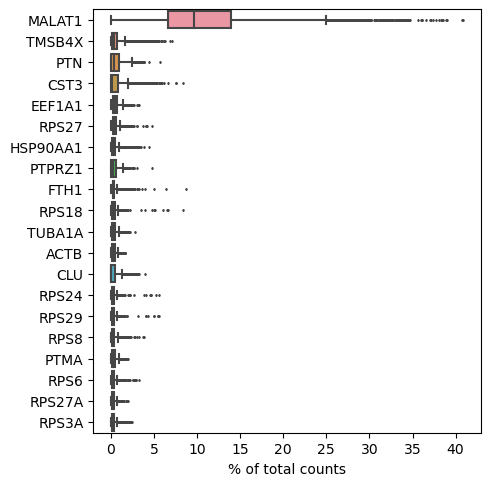

In [12]:
sc.pl.highest_expr_genes(GW25_adata, n_top=20)

In [13]:
#Store the raw counts
GW25_adata.layers["counts"] = GW25_adata.X.copy()

In [14]:
#Normalize adata 
sc.pp.normalize_total(GW25_adata, target_sum=1e4)
sc.pp.log1p(GW25_adata)

#Store normalized and logarithmized raw gene expression for later use
GW25_adata.raw = GW25_adata

#Identify hvg
sc.pp.highly_variable_genes(GW25_adata)

#Filter hvg
GW25_adata = GW25_adata[:, GW25_adata.var.highly_variable]

#Scale data
sc.pp.scale(GW25_adata)

#Process the data
sc.tl.pca(GW25_adata)
sc.pp.neighbors(GW25_adata)
sc.tl.umap(GW25_adata)
sc.tl.leiden(GW25_adata)


/home/ernohanninen/miniconda3/envs/PYenv/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [15]:
GW25_adata

AnnData object with n_obs × n_vars = 8064 × 2282
    obs: 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'leiden'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'scrublet', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

# Plotting the UMAP of the processed data

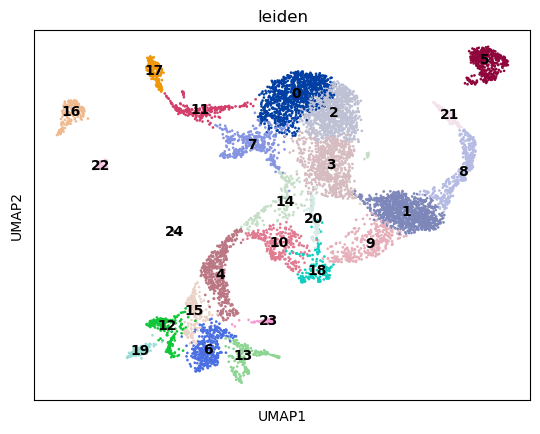

In [16]:
sc.pl.umap(GW25_adata, color="leiden", legend_loc="on data")

In [17]:
sc.tl.rank_genes_groups(GW25_adata, 'leiden', method='t-test')

/home/ernohanninen/miniconda3/envs/PYenv/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/ernohanninen/miniconda3/envs/PYenv/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/ernohanninen/miniconda3/envs/PYenv/lib/python3.10/site-packages/scanpy/tools/_rank_genes_grou

# Plotting the genes for each cluster

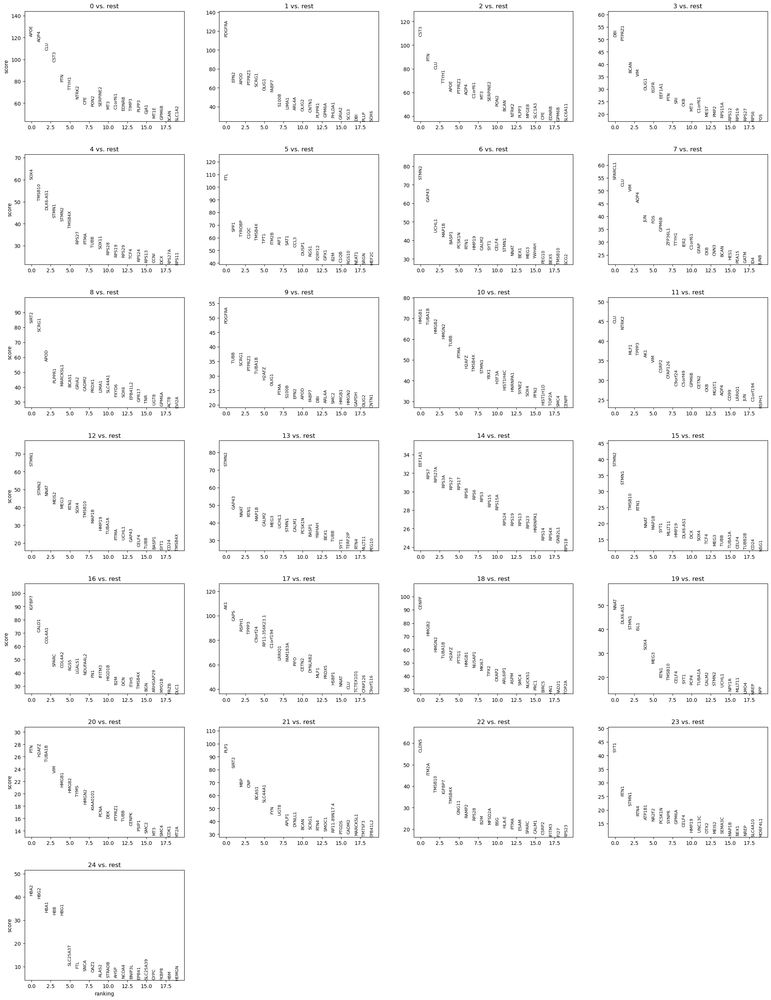

In [18]:
sc.pl.rank_genes_groups(GW25_adata, n_genes=20, sharey=False)

Mature oligidendrocytes:


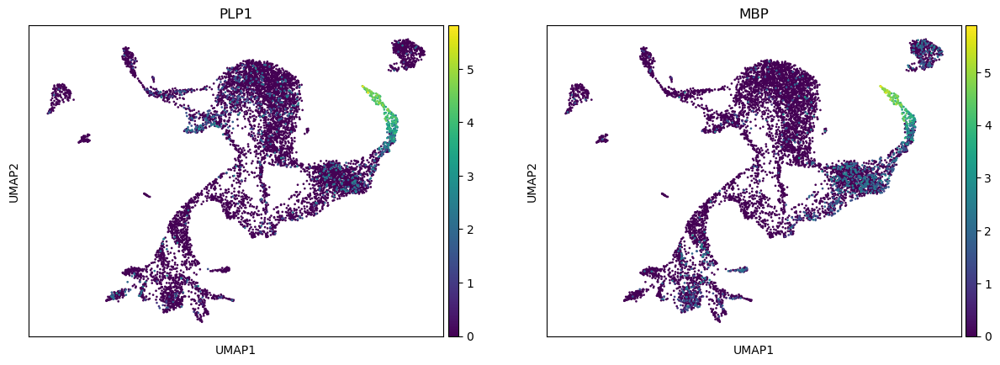

Oligo progenitors:


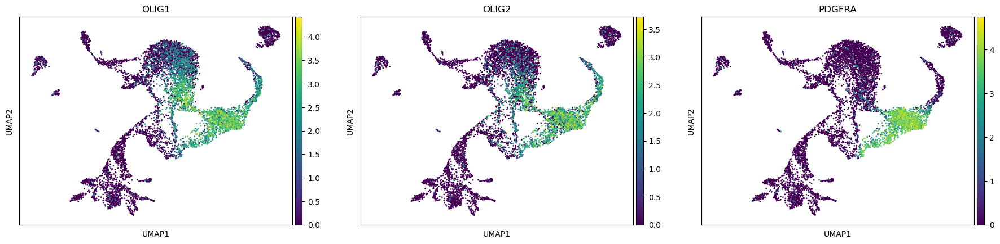

Astrocyte


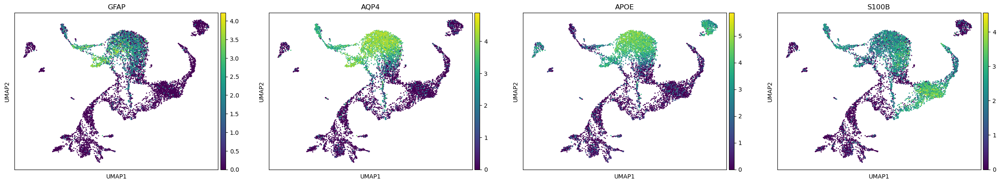

Progenitor markers


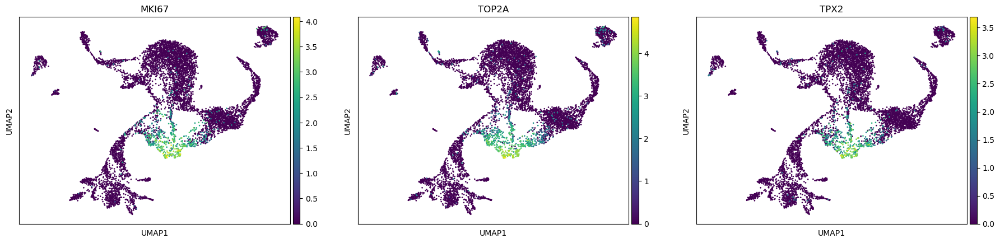

'print("Tanycyte")\nsc.pl.umap(GW25_adata, color=["GFAP", "APOE", "AQP4"])\nsc.pl.umap(GW25_adata, color=["VIM", "ID3", "SULF1"])\n#sc.pl.umap(GW25_adata, color=["RAX", "NPY", "SOX4", "DLK1", "DBI"])\n'

In [42]:
print("Mature oligidendrocytes:")
sc.pl.umap(GW25_adata, color=["PLP1", "MBP"])

print("Oligo progenitors:")
sc.pl.umap(GW25_adata, color=["OLIG1", "OLIG2", "PDGFRA"])


#print("Neural progenitors")
##print("Neurons")
#sc.pl.umap(GW25_adata, color=["STMN2"])

#sc.pl.umap(GW25_adata, color=['NUSAP1', 'TYMS', 'CENPF', 'TOP2A', 'CDK1', 'PBK', 'MKI67', 'BIRC5', 'TPX2', 'ESCO2', 'UBE2T', 'CENPU', 'KIF11', 'UBE2C', 'NUF2', "HIST1H1D"])



print("Astrocyte")
sc.pl.umap(GW25_adata, color=["GFAP", "AQP4", "APOE", "S100B"])


print("Progenitor markers")
sc.pl.umap(GW25_adata, color=["MKI67", "TOP2A", "TPX2"])

"""print("VLMC")

#print("Blood cells")
#sc.pl.umap(GW25_adata, color=["HBG2", "HBG1", "HBB"])

print("Endothelial")
sc.pl.umap(GW25_adata, color=["PECAM1", "CLDN5", "CD34"])
sc.pl.umap(GW25_adata, color=["VWF", "CDH5", "CD93"])
sc.pl.umap(GW25_adata, color=["FLT1", "ADGRL4", "KDR"])

print("Ependymal")
sc.pl.umap(GW25_adata, color=["FAM166B", "AK7", "CFAP126", "DNAH12"])
sc.pl.umap(GW25_adata, color=["FOXJ1", "PIFO", "RSPH1", "CCDC153"])
sc.pl.umap(GW25_adata, color=["DYNLRB2", "CFAP44","ODF3B"])
sc.pl.umap(GW25_adata, color=["FAM216B", "ZMYND10", "TEKT1"])"""

"""print("Pericyte:")
sc.pl.umap(GW25_adata, color=["NDUFA4L2", "HIGD1B", "NOTCH3"])



print("Microglia:")
sc.pl.umap(GW25_adata, color=["AIF1", "FCER1G", "TYROBP"])
sc.pl.umap(GW25_adata, color=["CX3CR1","P2RY12", "CD68", "TREM2"])
"""


"""print("Tanycyte")
sc.pl.umap(GW25_adata, color=["GFAP", "APOE", "AQP4"])
sc.pl.umap(GW25_adata, color=["VIM", "ID3", "SULF1"])
#sc.pl.umap(GW25_adata, color=["RAX", "NPY", "SOX4", "DLK1", "DBI"])
"""



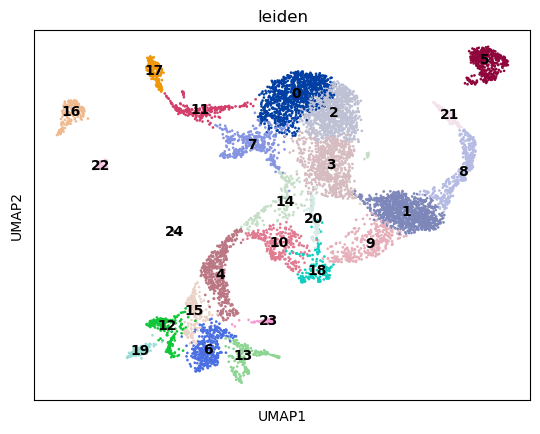

In [20]:
sc.pl.umap(GW25_adata, color="leiden", legend_loc="on data")

- Blood cells: 24
- Endothelial: 22
- Ependymal: 17
- Pericyte: 16
- Tanycyte: 7
- Microglia: 5
- Astrocyte: 0, 2
- Mature oligodendrocytes: 21, 8
- Oligodendrocyte progenitor: 1
Astrocyte progenitor:
Neural progenitor: 
- Neurons: 4, 15, 12, 19, 6, 13, (23)
Radial glia
 - VLMC: 9


# Interpretation of marker genes found online

### See plots below the next code block

The markers used in the plots below I found online, so those are not from the plot above. The markers are either from literature or from the panglaoDB database. Based on these marker genes I've plotted below, I would classify the clusters in the following way:
- 7 and 22: Microglia
- 0, 2: Astrocytes
- 9, and maybe 1 and 6: Oligodendrocytes
    - Most if not all of the markers I used to identify Oligidendrocytes are required for oligodendrocyte differentiation, so what if I am mixing things up and clusters 1 and 6 are actually dividing progerenitor cells?
- 15: Pericytes
- 19: Endothelial
- 14: Ependymal, however the marker genes I used to identify the ependymal cells also expresses in cluster 13 and I have no idea what that cluster could be.
- Dividing progenitors: I would guess that it is located in somewhere around clusters 3 and 16, as these clusters expresses olig1 and olig2, required for oligodendrocyte differentiation. Clusters 10, 12 might also be dividing progenitors due to the expression of VIM, NES and HES1. Note that below I have plotted more progenitor marker genes, that indicates different clusters than these.


Microglia:


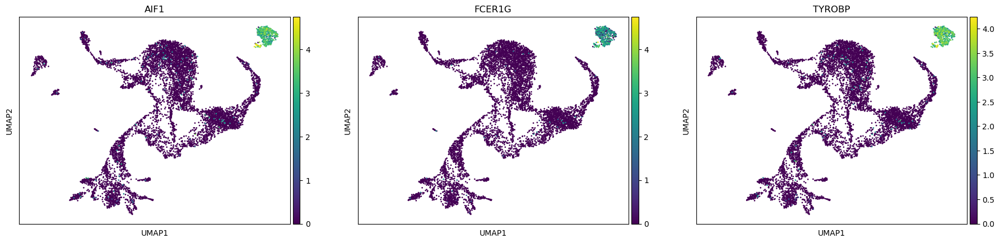

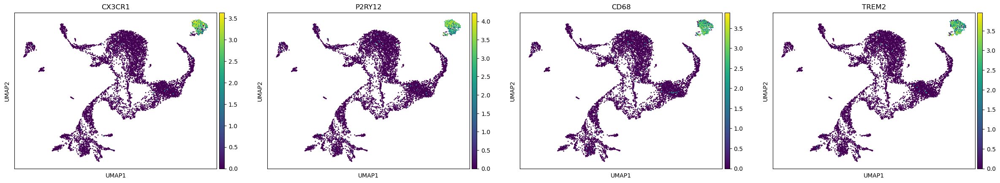

Astrocyte:


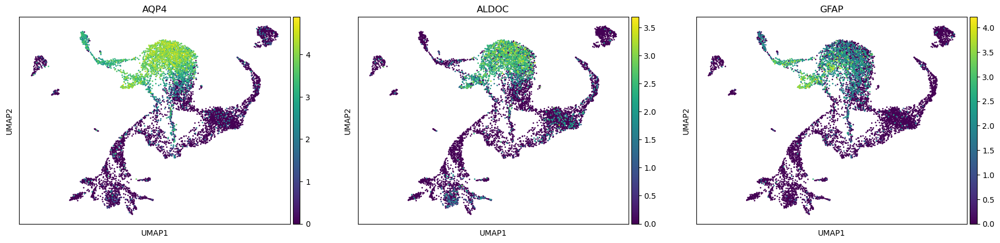

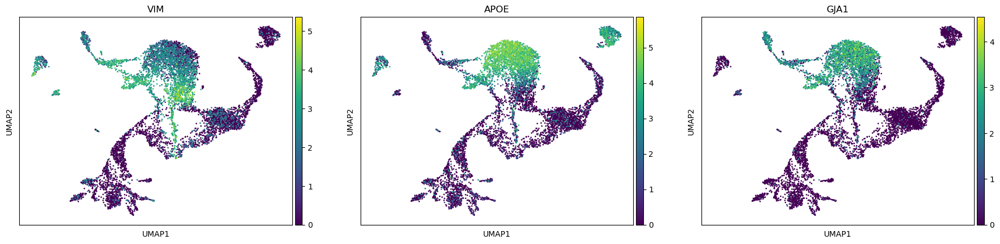

Oligodendrocyte:


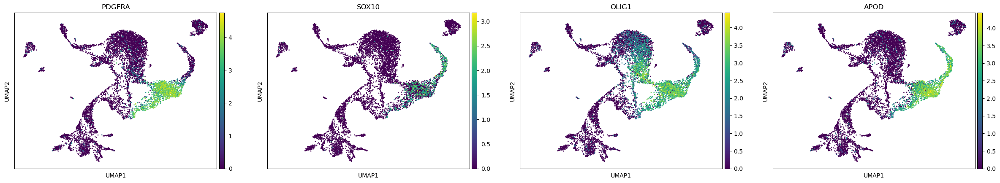

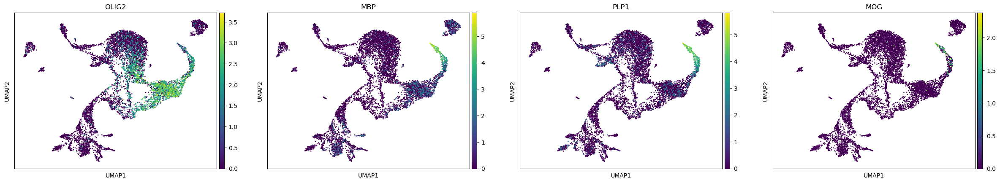

Dividing progenitor:


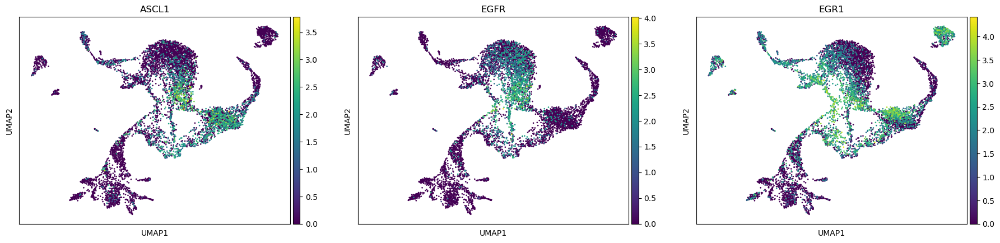

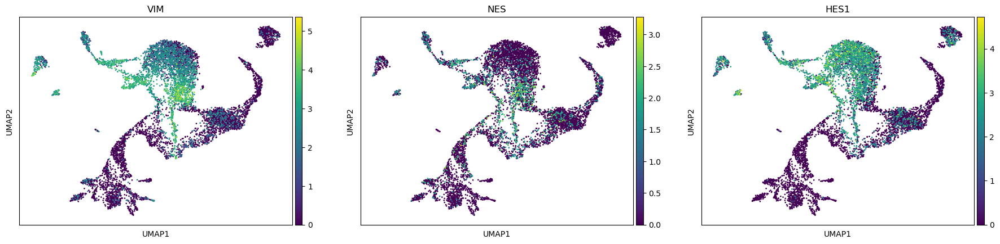

Pericyte:


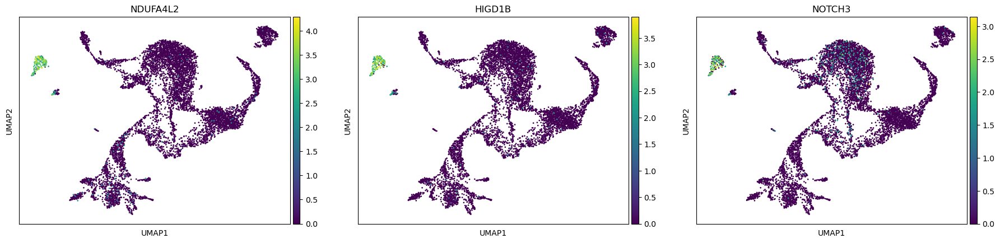

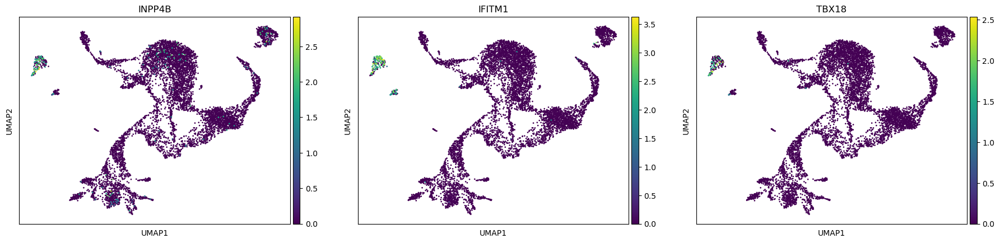

Endothelial


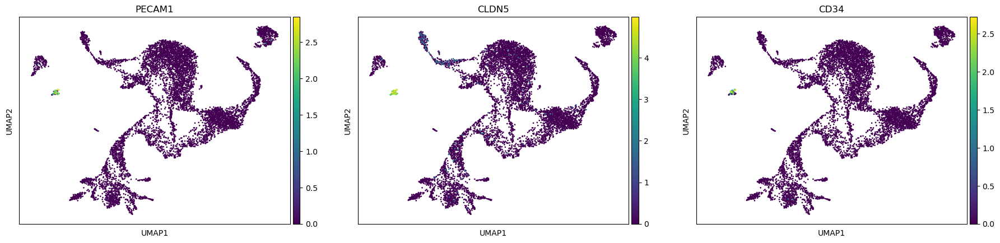

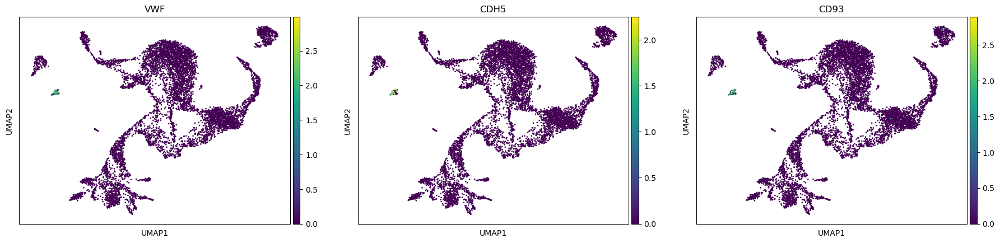

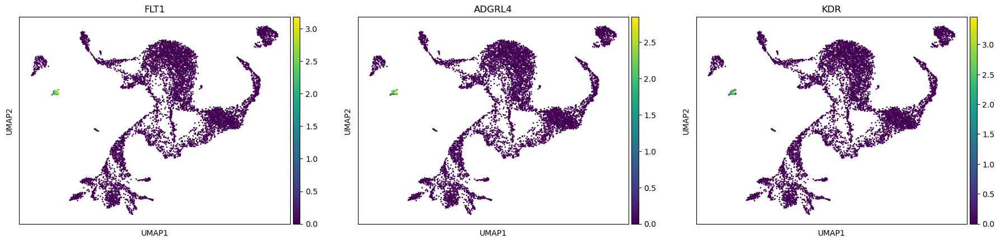

Ependymal


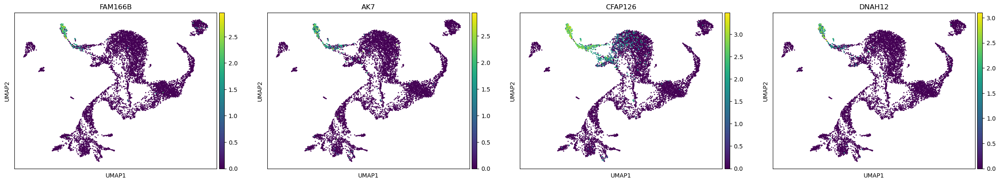

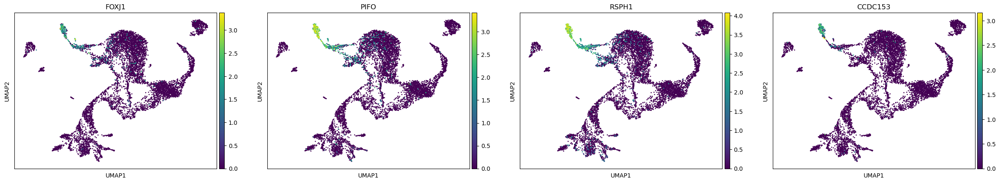

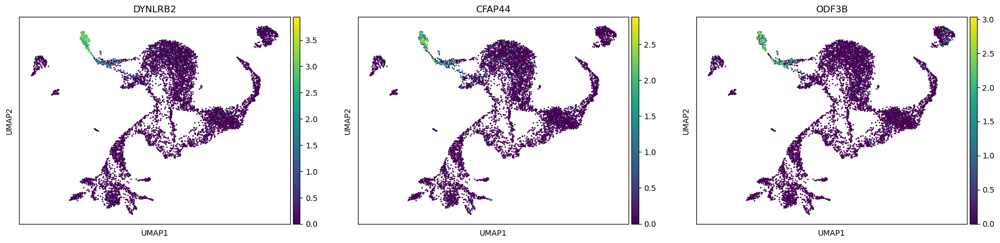

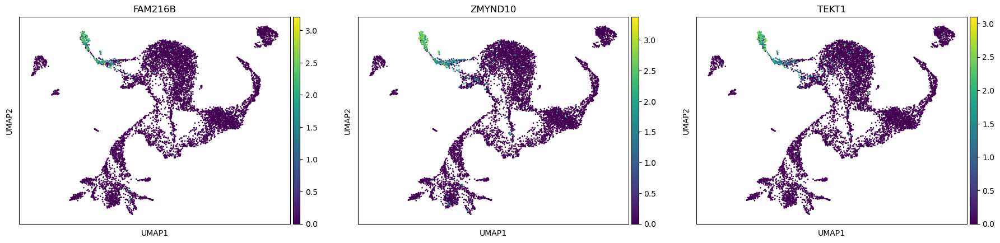

In [21]:
print("Microglia:")
sc.pl.umap(GW25_adata, color=["AIF1", "FCER1G", "TYROBP"])
sc.pl.umap(GW25_adata, color=["CX3CR1","P2RY12", "CD68", "TREM2"])
print("Astrocyte:")
sc.pl.umap(GW25_adata, color=["AQP4", "ALDOC", "GFAP"])
sc.pl.umap(GW25_adata, color=["VIM", "APOE", "GJA1"])
print("Oligodendrocyte:")
sc.pl.umap(GW25_adata, color=["PDGFRA", "SOX10", "OLIG1", "APOD"])
sc.pl.umap(GW25_adata, color=["OLIG2", "MBP", "PLP1", "MOG"])
print("Dividing progenitor:")
sc.pl.umap(GW25_adata, color=["ASCL1", "EGFR", "EGR1"])
sc.pl.umap(GW25_adata, color=["VIM","NES", "HES1"])
print("Pericyte:")
sc.pl.umap(GW25_adata, color=["NDUFA4L2", "HIGD1B", "NOTCH3"])
sc.pl.umap(GW25_adata, color=["INPP4B", "IFITM1", "TBX18"])
print("Endothelial")
sc.pl.umap(GW25_adata, color=["PECAM1", "CLDN5", "CD34"])
sc.pl.umap(GW25_adata, color=["VWF", "CDH5", "CD93"])
sc.pl.umap(GW25_adata, color=["FLT1", "ADGRL4", "KDR"])
print("Ependymal")
sc.pl.umap(GW25_adata, color=["FAM166B", "AK7", "CFAP126", "DNAH12"])
sc.pl.umap(GW25_adata, color=["FOXJ1", "PIFO", "RSPH1", "CCDC153"])
sc.pl.umap(GW25_adata, color=["DYNLRB2", "CFAP44","ODF3B"])
sc.pl.umap(GW25_adata, color=["FAM216B", "ZMYND10", "TEKT1"])



# Interpreting the ranked genes plot

### See plots below

After my online search some of the cell types remained unknown for me, therefore I examined genes from the ranked genes plot. In the plot only top 20 genes are plotted, however for some clusters I explored max top 500 genes, because I had difficulties to find genes specific for clusters.

After my Online search some of the clusters and the following cell types remained unclear:
Blood, dividing progenitors, radial glia, tanycytes, neuronal cell types, VLMC




### Plotting the UMAP for refreshment


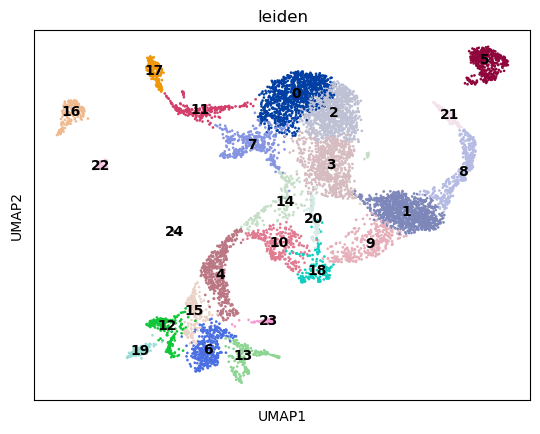

In [22]:
sc.pl.umap(GW25_adata, color="leiden", legend_loc="on data")

## Cluster  6, 11 and 16 (see the code block and umap's below)
I found several genes which are expressed in all of these clusters, this makes me assume that these may represent same cell type

This is how I interpret the literature:
- NUSAP1, TYMS, BIRC5, CENPF, TPX2, KIF11, NUF2 are cell cycle related genes (https://www.nature.com/articles/s41467-021-22640-z) 
- IN addition ESCO2, UBE2T, CENPU, UBE2C, MKI67 is used as marker in atleast one of the following processes cell cycle / proliferation / differentation (These results are not from hypothalamus)
- TOP2A is used as marker for oligodendrocyte precursor
- Expression of PBK might indicate to neural progenitors


-> could these results indicate that 6, 11 and 16 are neural progenitors?

NOTE, above I have plotted some other progenitor marker genes -> those results indicated that clusters 3,  10 and 12 might also be progenitors. Those marker genes, didn't show great expression in clusters 6 and 11 

Examining clusters 6, 11 and 16


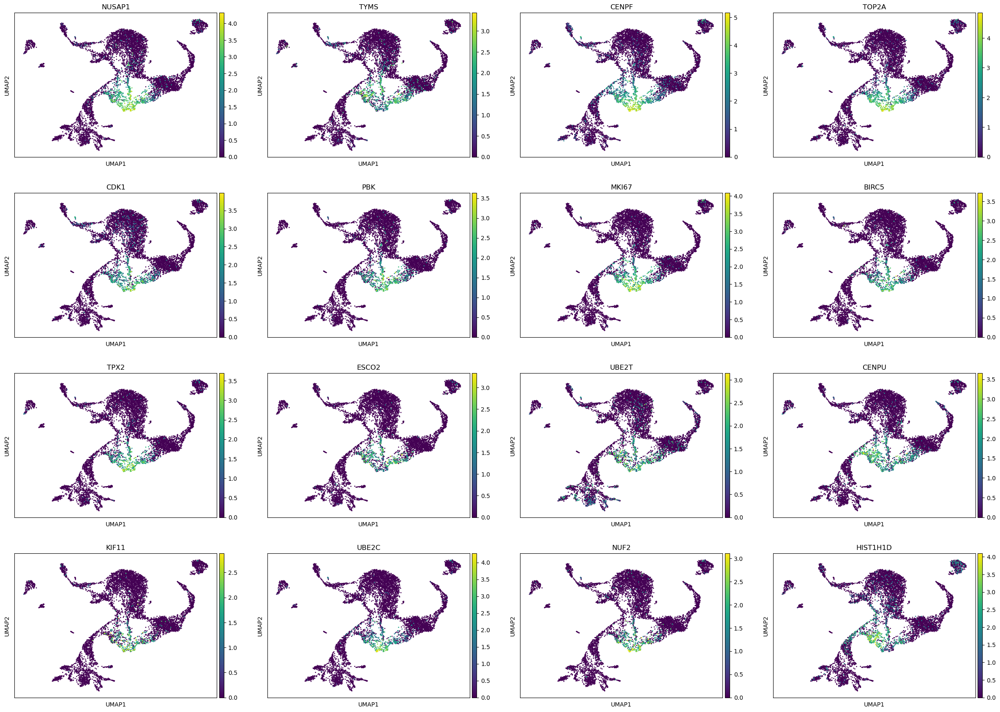

In [23]:
print("Examining clusters 6, 11 and 16")
sc.pl.umap(GW25_adata, color=['NUSAP1', 'TYMS', 'CENPF', 'TOP2A', 'CDK1', 'PBK', 'MKI67', 'BIRC5', 'TPX2', 'ESCO2', 'UBE2T', 'CENPU', 'KIF11', 'UBE2C', 'NUF2', "HIST1H1D"])



## Cluster 13
For cluster 13 I had difficulties to find markers that would be specific to cluster 13 only. These are the best I found. Most of the markers found for cluster 14 is expressed also in cluster 13. Above, based on my online search, I assumed that cluster 14 is Ependymal and that cluster 19 is endothelial. IFI27 gene is one of the few genes in here showing a low expression in cluster 14. Based on panglaoDB database IFI27 is expressed in ependymal but not in endothelial cells. I thought IFI27 might give a hint of the cluster.

SFRP2 regulates WNT signaling which regulates patterning, differentiation and nucleogenesis in mouse hypothalamus and prethalamus

I tried to read about the markers, but still don't have idea about cluster 13

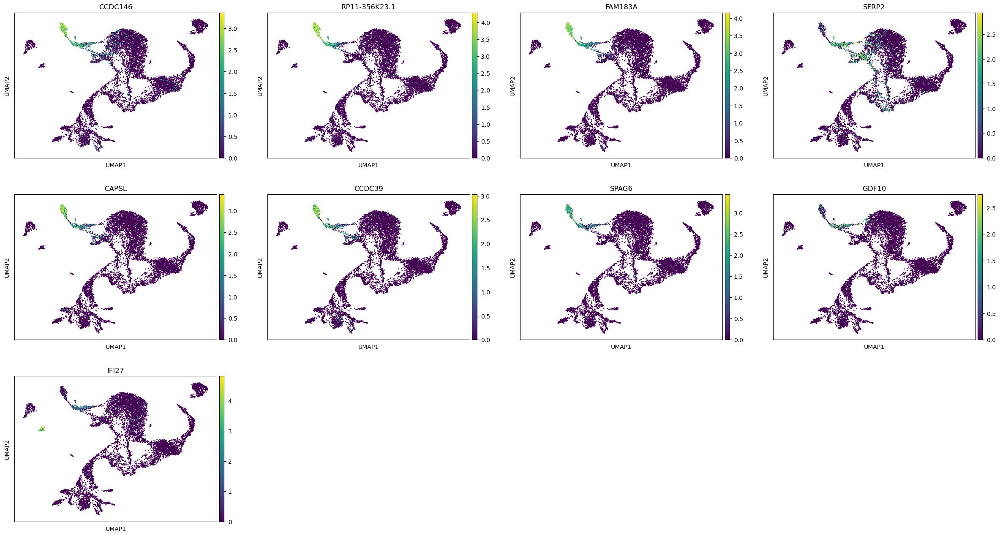

In [24]:
sc.pl.umap(GW25_adata, color=['CCDC146', 'RP11-356K23.1', 'FAM183A', 'SFRP2', 'CAPSL', 'CCDC39', 'SPAG6', 'GDF10', 'IFI27'])


## Cluster 18

I found this from online: "Vascular leptomeningeal cells (VLMCs) are a population of fibroblast-like cells located at the interface between the endothelium and the astroglial endfoot layer surrounding the parenchyma and characterized by expression of Pdgfra". 

I used PDGFRA as a marker for Oligodendrocytes. In this article it is stated that PRGFRA can be used to identify both VLMC and oligodendrocyte precursor cells (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6984808/).

-> Based to the plot below cluster 18 might be VLMC

However, the article suggests also other markers for VLMC, such as: LUM, OGN, DCN -> the plots of these genes doesn't support the hypothesis that cluster 18 is VLMC


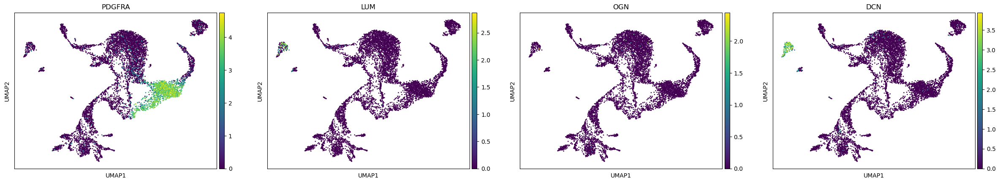

In [25]:
sc.pl.umap(GW25_adata, color=['PDGFRA', "LUM", "OGN", "DCN"])


## CLUSTERS 4, 5, 8, 17

All the genes plotted below has something to do with neurons (not sure of HGB 1 and 2, and HBB) -> hence I belive that we have neuronal populations around clusters 4, 5, 8 and 17


THe cluster 17 is difficult as it contains two distinct clusters, other expressing neuronal and other expressing the hemoglobin genes.

Could the expression of hemoglobin genes indicate that these are Blood cells?


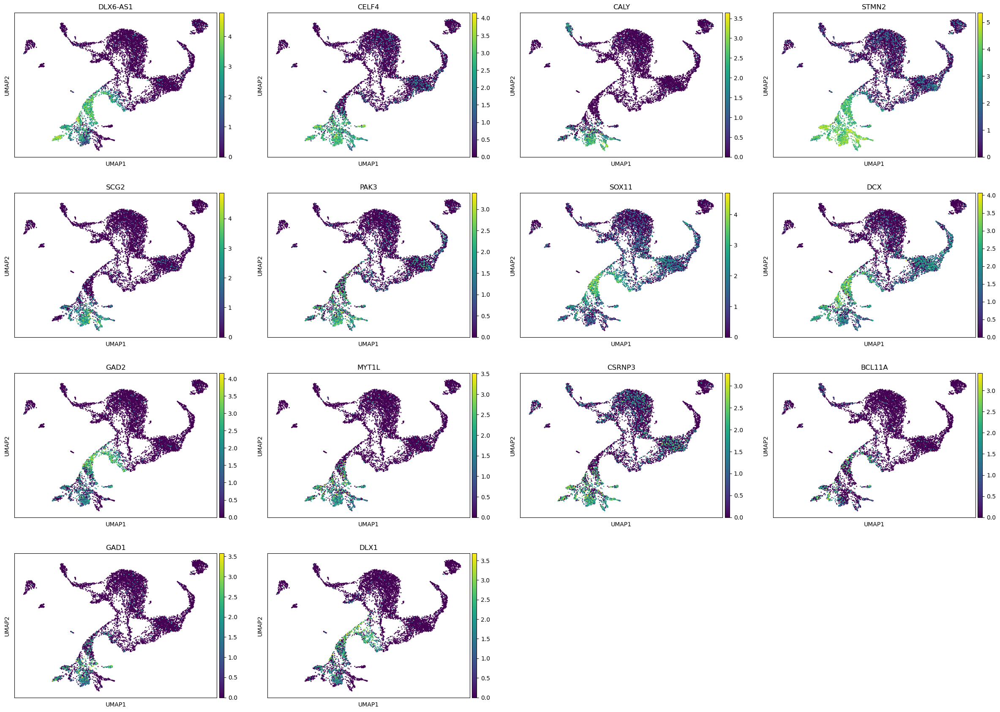

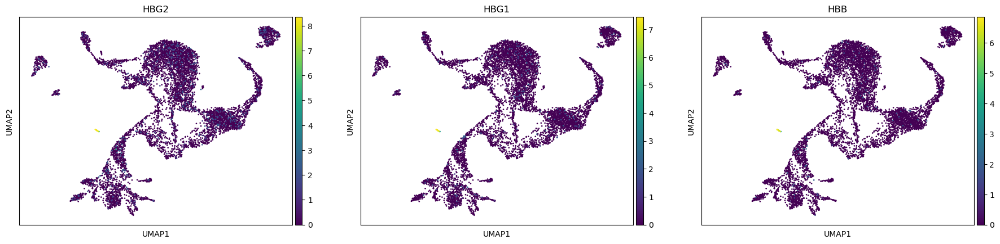

In [26]:
sc.pl.umap(GW25_adata, color=['DLX6-AS1', "CELF4", "CALY", "STMN2", 'SCG2', "PAK3", "SOX11", "DCX", 'GAD2', "MYT1L", "CSRNP3", "BCL11A", "GAD1", "DLX1"])
sc.pl.umap(GW25_adata, color=["HBG2", "HBG1", "HBB"])


# Cluster 10


Didn't find what these markers represents

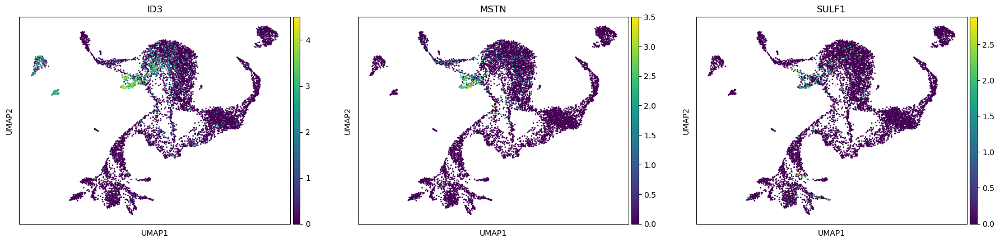

In [27]:
sc.pl.umap(GW25_adata, color=["ID3", "MSTN", "SULF1"])


## Cluster 20

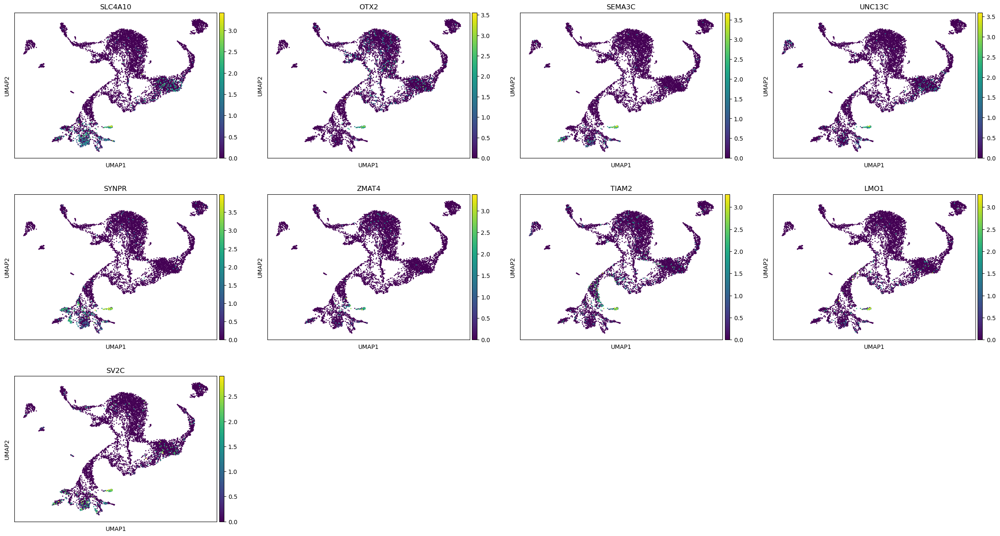

In [28]:
sc.pl.umap(GW25_adata, color=["SLC4A10", "OTX2", "SEMA3C", "UNC13C", "SYNPR", "ZMAT4", "TIAM2", "LMO1", "SV2C"])


## Conclusions

Based on my intepretation of plotted marker genes from online and from the ranked genes plot,  I would classify the clusters in the following way:

- Cluster 0: Astrocytes
- Cluster 1: Oligodendrocytes
- Cluster 2: Astrocytes
- Cluster 3: Dividing progenitors (unsure)
- Cluster 4: Neuronal cells
- Cluster 5: Neuronal cells
- Cluster 6: Dividing progenitors OR oligodendrocytes
- Cluster 7: Microglia
- Cluster 8: Neuronal cells
- Cluster 9: Oligodendrocytes
- Cluster 10: - 
- Cluster 11: Dividing progenitors (unsure)
- Cluster 12: - 
- Cluster 13: - 
- Cluster 14: Ependymal
- Cluster 15: Pericytes
- Cluster 16: Dividing progenitors
- Cluster 17: Neuronal cells / blood (unsure)
- Cluster 18: VLMC (unsure)
- CLuster 19: Endothelial
- Cluster 20: -
- Cluster 21: - 
- Cluster 22: Microglia
- Cluster 23: -


Remains unknown: Unsure of VLMC, blood, tanycyte.


The exact location of oligodendrocytes, astrocytes, dividing progenitors, neuronal cell types is unknown.


In addition I didn't find genes specific for cluster 12, 21 and 23, therefore the cell type of these cluster is unknown.


For clusters 13, 10 and 20 I found more specific marker genes, but couldn't assign a cell type for these clusters.
